# VIGIAGADO — VERSÃO FINAL YOLO26s
**Monitoramento visual de bovinos**

Aluno: Carlos Ernesto Martins Vieira Neto

**Modo padrão:** produto pronto / sem retreinamento  
**Detector:** YOLO26s fine-tuned  
**Dataset de especialização:** Open Images V7 / `Cattle`  
**Vídeo de demonstração:** `gado5.mp4`

**Fluxo:** vídeo → detector especializado → contagem/ROI → estados temporais → eventos → evidências → decisão humana.

> **Para apresentar / usar o produto:** selecione uma GPU no Google Colab, mantenha `RETRAIN_MODEL = False`, disponibilize `yolo26s_bovino_best.pt` e `gado5.mp4` e execute **Runtime → Run all**.


## 1. Introdução
O VigiaGado é um sistema acadêmico de apoio à decisão para análise visual de bovinos em uma área observada por câmera. Ele transforma detecções em informações revisáveis: contagem visível, presença em uma região configurada, eventos persistentes, tabelas e imagens de evidência.

O produto não pretende localizar individualmente cada animal, representar o inventário completo da propriedade ou provar ausência física quando uma detecção deixa de ocorrer.


## 2. Problema
Em uma área de criação, o responsável pode precisar verificar:

- quantos bovinos estão **visíveis** no campo de visão;
- se essa quantidade diverge de um valor esperado **para a área visível**;
- se há presença persistente em uma região 2D configurada como **Danger Zone**;
- quais ocorrências merecem revisão humana.

O sistema atua sobre aquilo que a câmera observa. Oclusões, iluminação, distância e enquadramento limitam o que pode ser inferido.


## 3. Produto e escopo
A versão final utiliza exclusivamente um **YOLO26s fine-tuned para bovinos**, com classe única `0: bovino`.

O núcleo do produto permanece:

- contagem visual por frame;
- ROI/Danger Zone retangular;
- bottom-center da bounding box como aproximação da posição do animal no solo;
- persistência temporal para presença e divergência;
- eventos agregados;
- vídeo anotado;
- `contagens.csv`, `eventos.csv`, `episodios.csv`, `detections.json`;
- frames de evidência;
- exportação OpenCV/FFmpeg.

**Semântica:** divergência não significa animal perdido; Danger Zone não é geofence GPS; ausência de detecção não comprova ausência física.


## 4. Como executar

### Apresentação / uso normal
1. Abra este notebook no Google Colab.
2. Selecione uma GPU.
3. Mantenha `RETRAIN_MODEL = False`.
4. Disponibilize `yolo26s_bovino_best.pt` e `gado5.mp4`.
5. Execute **Runtime → Run all**.

Nesse modo o notebook **não baixa o Open Images, não instala FiftyOne, não treina e não refaz a validação pesada**. Ele carrega o modelo especializado, usa métricas salvas quando disponíveis e executa o produto.

### Reprodução do fine-tuning
Defina apenas:

`RETRAIN_MODEL = True`

e execute **Run all**. O notebook prepara/reutiliza o subconjunto público, audita, treina, valida, preserva artefatos e então executa o produto.


In [ ]:
RETRAIN_MODEL = False #@param {type:"boolean"}

print("VigiaGado — versão final YOLO26s")
print("Retreinamento:", "ATIVADO" if RETRAIN_MODEL else "desativado")
print("Modo:", "reprodução do fine-tuning" if RETRAIN_MODEL else "produto pronto / apresentação")


VigiaGado — versão final YOLO26s
Retreinamento: desativado
Modo: produto pronto / apresentação


## 5. Dependências
No modo normal são instaladas apenas dependências necessárias para o produto. **FiftyOne só é instalado quando `RETRAIN_MODEL=True`.**

O notebook registra as versões efetivamente disponíveis, além de CUDA, GPU e VRAM. O PyTorch/CUDA fornecido pelo ambiente não é rebaixado intencionalmente.


In [ ]:
import sys, subprocess, shutil, importlib.metadata

ULTRALYTICS_VERSION = "8.4.147"
OPENCV_VERSION = "4.11.0.86"
FIFTYONE_VERSION = "1.21.0"

required = {"ultralytics": ULTRALYTICS_VERSION, "opencv-python": OPENCV_VERSION}
needs_install = False
for package, version in required.items():
    try:
        needs_install |= importlib.metadata.version(package) != version
    except importlib.metadata.PackageNotFoundError:
        needs_install = True

if needs_install:
    subprocess.check_call([
        sys.executable, "-m", "pip", "install", "-q",
        f"ultralytics=={ULTRALYTICS_VERSION}",
        f"opencv-python=={OPENCV_VERSION}",
        "pandas>=2", "pillow>=10", "matplotlib>=3.8"
    ])

if RETRAIN_MODEL:
    if sys.version_info < (3, 10):
        raise RuntimeError("FiftyOne 1.21.0 requer Python >= 3.10.")
    try:
        fo_version = importlib.metadata.version("fiftyone")
    except importlib.metadata.PackageNotFoundError:
        fo_version = None
    if fo_version != FIFTYONE_VERSION:
        subprocess.check_call([
            sys.executable, "-m", "pip", "install", "-q",
            f"fiftyone=={FIFTYONE_VERSION}"
        ])

if not shutil.which("ffmpeg"):
    subprocess.check_call(["apt-get", "update", "-qq"])
    subprocess.check_call(["apt-get", "install", "-y", "-qq", "ffmpeg"])

print("Dependências principais disponíveis.")
print("FiftyOne:", "necessário para esta execução" if RETRAIN_MODEL else "não necessário no modo apresentação")


Dependências principais disponíveis.
FiftyOne: não necessário no modo apresentação


In [ ]:
from pathlib import Path
import csv
import json
import os
import platform
import subprocess
import tempfile
import time
from functools import lru_cache
import importlib.metadata
import cv2
import numpy as np
import torch
from ultralytics import YOLO
from PIL import Image, ImageDraw, ImageFont
import pandas as pd
from datetime import datetime
from IPython.display import display, Video, FileLink

gpu_name = torch.cuda.get_device_name(0) if torch.cuda.is_available() else "CPU"
gpu_vram_gb = (torch.cuda.get_device_properties(0).total_memory / 1024**3) if torch.cuda.is_available() else 0
print("Python:", platform.python_version())
print("PyTorch:", torch.__version__)
print("Ultralytics:", importlib.metadata.version("ultralytics"))
print("OpenCV:", cv2.__version__)
print("CUDA disponível:", torch.cuda.is_available())
print("Dispositivo:", gpu_name)
if torch.cuda.is_available():
    print(f"VRAM: {gpu_vram_gb:.1f} GB")


Creating new Ultralytics Settings v0.0.8 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/usage/settings.
Python: 3.13.15
PyTorch: 2.11.0+cu128
Ultralytics: 8.4.147
OpenCV: 4.11.0
CUDA disponível: True
Dispositivo: NVIDIA A100-SXM4-40GB
VRAM: 39.5 GB


## 6. Vídeo de demonstração e arquivos necessários
O único vídeo exigido para a demonstração é **`gado5.mp4`**. Sufixos gerados por navegador, como `gado5(3).mp4`, também são aceitos.

No Colab, se um arquivo obrigatório estiver ausente, o notebook abre um único seletor de upload. O vídeo é usado localmente; não deve ser redistribuído no repositório enquanto sua licença de redistribuição não estiver confirmada.


In [ ]:
try:
    from google.colab import files
    IN_COLAB = True
except ImportError:
    IN_COLAB = False

ROOT_WORK = Path("/content") if IN_COLAB else Path.cwd()
ARTIFACT_DIR = ROOT_WORK / "vigiagado_artifacts"
ARTIFACT_DIR.mkdir(parents=True, exist_ok=True)

BEST_WEIGHTS = ARTIFACT_DIR / "yolo26s_bovino_best.pt"
LAST_WEIGHTS = ARTIFACT_DIR / "yolo26s_bovino_last.pt"
EPOCH9_WEIGHTS = ARTIFACT_DIR / "yolo26s_bovino_epoch09.pt"
FINETUNED_METRICS_PATH = ARTIFACT_DIR / "finetuned_metrics.json"
TRAINING_MANIFEST = ARTIFACT_DIR / "training_manifest.json"

def _find_gado5():
    roots = [ROOT_WORK, Path.cwd(), Path.cwd() / "demo"]
    candidates = []
    for root in roots:
        if root.exists():
            candidates.extend(
                p for p in root.glob("gado5*.mp4")
                if p.is_file()
            )
    unique = sorted({p.resolve() for p in candidates}, key=lambda p: (len(p.name), p.name))
    return unique[0] if unique else None

def _find_specialized_weights():
    env_path = os.environ.get("VIGIAGADO_MODEL_WEIGHTS")
    if env_path and Path(env_path).is_file():
        return Path(env_path)

    exact = [
        BEST_WEIGHTS,
        ROOT_WORK / "yolo26s_bovino_best.pt",
        Path.cwd() / "artifacts" / "yolo26s_bovino_best.pt",
        Path.cwd() / "yolo26s_bovino_best.pt",
    ]
    for p in exact:
        if p.is_file():
            return p

    generic = []
    for root in [ROOT_WORK, Path.cwd(), Path.cwd() / "artifacts"]:
        if root.exists():
            generic.extend(p for p in root.glob("best.pt") if p.is_file())
    generic = sorted({p.resolve() for p in generic})
    return generic[0] if len(generic) == 1 else None

def _import_optional_metrics():
    if FINETUNED_METRICS_PATH.is_file():
        return
    for p in [
        ROOT_WORK / "finetuned_metrics.json",
        Path.cwd() / "artifacts" / "finetuned_metrics.json",
        Path.cwd() / "finetuned_metrics.json",
    ]:
        if p.is_file():
            shutil.copy2(p, FINETUNED_METRICS_PATH)
            return

DEMO_VIDEO = _find_gado5()
DISCOVERED_WEIGHTS = _find_specialized_weights()

needs_upload = DEMO_VIDEO is None or (not RETRAIN_MODEL and DISCOVERED_WEIGHTS is None)
if IN_COLAB and needs_upload:
    print("Envie os arquivos obrigatórios desta execução.")
    print("- gado5.mp4")
    if not RETRAIN_MODEL:
        print("- yolo26s_bovino_best.pt")
    previous_directory = Path.cwd()
    os.chdir(ROOT_WORK)
    try:
        files.upload()
    finally:
        os.chdir(previous_directory)
    DEMO_VIDEO = _find_gado5()
    DISCOVERED_WEIGHTS = _find_specialized_weights()

if DEMO_VIDEO is None:
    raise FileNotFoundError(
        "gado5.mp4 não foi encontrado. No Colab, envie o arquivo; "
        "localmente coloque-o em demo/ ou no diretório de execução."
    )

if not RETRAIN_MODEL and DISCOVERED_WEIGHTS is None:
    raise FileNotFoundError(
        "yolo26s_bovino_best.pt não foi encontrado. "
        "Disponibilize o peso especializado ou use RETRAIN_MODEL=True para reproduzir o treinamento."
    )

if DISCOVERED_WEIGHTS is not None and DISCOVERED_WEIGHTS.resolve() != BEST_WEIGHTS.resolve():
    if not BEST_WEIGHTS.exists():
        shutil.copy2(DISCOVERED_WEIGHTS, BEST_WEIGHTS)
        print("Peso especializado copiado para o caminho canônico:", BEST_WEIGHTS)

_import_optional_metrics()

print("Vídeo:", DEMO_VIDEO)
if BEST_WEIGHTS.exists():
    print("Peso especializado:", BEST_WEIGHTS)
elif RETRAIN_MODEL:
    print("Peso especializado será produzido pelo fine-tuning.")


Envie os arquivos obrigatórios desta execução.
- gado5.mp4
- yolo26s_bovino_best.pt


gado5.mp4 1920×1080 27.16s 25.00 FPS


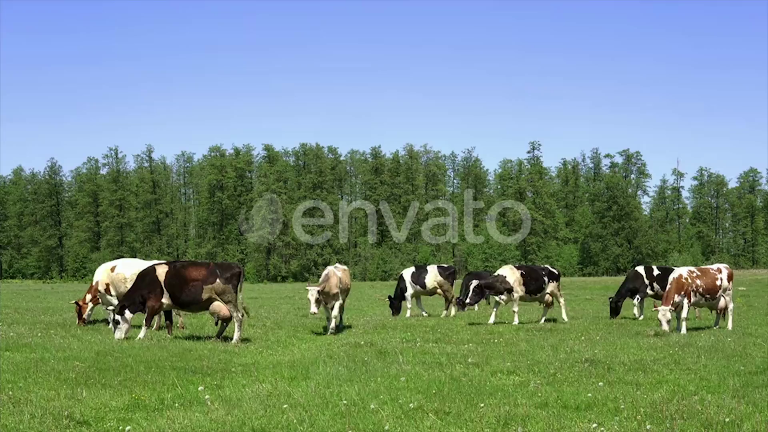

In [ ]:
cap = cv2.VideoCapture(str(DEMO_VIDEO))
ok, frame = cap.read()
rate = cap.get(cv2.CAP_PROP_FPS)
n = cap.get(cv2.CAP_PROP_FRAME_COUNT)
cap.release()

if not ok or rate <= 0:
    raise ValueError(f"Vídeo inválido: {DEMO_VIDEO.name}")

print(DEMO_VIDEO.name, f"{frame.shape[1]}×{frame.shape[0]}", f"{n/rate:.2f}s", f"{rate:.2f} FPS")
display(Image.fromarray(cv2.cvtColor(cv2.resize(frame, (768,432)), cv2.COLOR_BGR2RGB)))


## 7. Funções centrais do VigiaGado
As funções espaciais e temporais abaixo preservam o comportamento validado do produto. O detector final possui uma única classe, `0: bovino`; o carregamento verifica isso explicitamente e não depende de índices de datasets genéricos.


In [ ]:
MODEL_WEIGHTS = BEST_WEIGHTS

def load_model(weights=None):
    """Carrega exclusivamente o detector YOLO26s fine-tuned do VigiaGado."""
    torch.set_num_threads(min(4, os.cpu_count() or 1))
    cv2.setNumThreads(1)

    weights = Path(weights) if weights is not None else MODEL_WEIGHTS
    if not weights.is_file():
        raise FileNotFoundError(f"Peso especializado não encontrado: {weights}")

    model = YOLO(str(weights))
    names = {int(k): str(v).strip().lower() for k, v in model.names.items()}
    if set(names.keys()) != {0} or names.get(0) != "bovino":
        raise ValueError(
            "O peso carregado deve possuir exatamente uma classe: {0: 'bovino'}. "
            f"model.names encontrado: {model.names}"
        )
    return model, [0]

def normalize_video(source, destination, fps=12, width=1280):
    """CFR e resolução limitada: mantém duração, sem recortar a imagem."""
    subprocess.run([
        "ffmpeg", "-hide_banner", "-loglevel", "error", "-y", "-i", str(source),
        "-map", "0:v:0", "-an", "-vf",
        f"fps={fps},scale='min({width},iw)':-2", "-c:v", "libx264",
        "-preset", "ultrafast", "-crf", "18", "-pix_fmt", "yuv420p", str(destination)
    ], check=True)

def encode_browser_video(source, destination):
    subprocess.run(["ffmpeg", "-hide_banner", "-loglevel", "error", "-y", "-i", str(source),
                    "-an", "-c:v", "libx264", "-preset", "fast", "-crf", "23",
                    "-pix_fmt", "yuv420p", "-movflags", "+faststart", str(destination)], check=True)

def write_csv(path, rows, fields):
    with Path(path).open("w", newline="", encoding="utf-8-sig") as f:
        writer = csv.DictWriter(f, fieldnames=fields)
        writer.writeheader()
        writer.writerows({k: r.get(k) for k in fields} for r in rows)

def detect_animals(model, cow_ids, frame, confidence=0.25, imgsz=640):
    result = model.predict(frame, classes=cow_ids, conf=confidence, imgsz=imgsz,
                           device=0 if torch.cuda.is_available() else "cpu", verbose=False)[0]
    return [{"xyxy": box.tolist(), "confidence": float(score)}
            for box, score in zip(result.boxes.xyxy.cpu().numpy(), result.boxes.conf.cpu().numpy())]


In [ ]:
def rectangle_pixels(roi, frame_shape):
    """ROI normalizada (esquerda, topo, direita, base), relativa à imagem original."""
    if len(roi) != 4 or not all(np.isfinite(v) and 0 <= v <= 1 for v in roi):
        raise ValueError("ROI: informe quatro números entre 0 e 1.")
    left, top, right, bottom = roi
    if left >= right or top >= bottom:
        raise ValueError("ROI: esquerda < direita e topo < base.")
    h, w = frame_shape[:2]
    return (left * w, top * h, right * w, bottom * h)

def is_inside_zone(xyxy, rectangle):
    x1, _, x2, y2 = xyxy
    x, y = (x1 + x2) / 2, y2
    left, top, right, bottom = rectangle
    return left <= x <= right and top <= y <= bottom

def draw_zone(frame, detections, roi):
    view = frame.copy()
    rect = rectangle_pixels(roi, view.shape)
    flags = [is_inside_zone(d["xyxy"], rect) for d in detections]
    color = (75, 90, 245) if any(flags) else (45, 195, 245)
    layer = view.copy()
    cv2.rectangle(layer, tuple(map(int, rect[:2])), tuple(map(int, rect[2:])), color, -1)
    view = cv2.addWeighted(layer, 0.18, view, 0.82, 0)
    cv2.rectangle(view, tuple(map(int, rect[:2])), tuple(map(int, rect[2:])), color, 2)
    cv2.putText(view, "ZONA SIMULADA", (int(rect[0]), max(20, int(rect[1])-10)),
                cv2.FONT_HERSHEY_SIMPLEX, 0.55, color, 2)
    for det, inside in zip(detections, flags):
        x1, y1, x2, y2 = map(int, det["xyxy"])
        c = (70, 90, 255) if inside else (70, 225, 120)
        cv2.rectangle(view, (x1, y1), (x2, y2), c, 2)
        cv2.rectangle(view, (x1, max(0, y1-22)), (min(view.shape[1]-1, x1+137), y1), (23, 31, 22), -1)
        cv2.putText(view, f"Bovino {det['confidence']:.2f}", (x1+3, max(15, y1-5)),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.48, c, 1)
        cv2.circle(view, ((x1+x2)//2, y2), 5, c, -1)
    return view, sum(flags)


In [ ]:
class TemporalState:
    """Confirma mudanças após persistência; uma transição gera um único evento."""
    def __init__(self, enter_s=0.25, clear_s=0.75):
        if enter_s < 0 or clear_s < 0:
            raise ValueError("Tempos de confirmação devem ser não negativos.")
        self.enter_s, self.clear_s = enter_s, clear_s
        self.active = False
        self.candidate_since = None

    def update(self, observed, time_s):
        observed = bool(observed)
        if observed == self.active:
            self.candidate_since = None
            return None
        if self.candidate_since is None:
            self.candidate_since = time_s
        delay = self.enter_s if observed else self.clear_s
        if time_s - self.candidate_since + 1e-9 < delay:
            return None
        change = {"active": observed, "onset_s": round(self.candidate_since, 4),
                  "confirmed_s": round(time_s, 4)}
        self.active = observed
        self.candidate_since = None
        return change

def validate_expected_count(expected_count, tolerance=0):
    if expected_count is not None and (isinstance(expected_count, bool) or
                                      int(expected_count) != expected_count or expected_count < 0):
        raise ValueError("expected_count deve ser inteiro >= 0 ou None.")
    if tolerance < 0 or int(tolerance) != tolerance:
        raise ValueError("A tolerância deve ser um inteiro >= 0.")

def count_differs(observed_count, expected_count, tolerance=0):
    return expected_count is not None and abs(observed_count - expected_count) > tolerance


In [ ]:
def dashboard_font(size):
    for path in ["/usr/share/fonts/truetype/dejavu/DejaVuSans.ttf",
                 "/usr/share/fonts/truetype/liberation2/LiberationSans-Regular.ttf"]:
        if Path(path).exists():
            return ImageFont.truetype(path, size)
    return ImageFont.load_default()

def draw_dashboard(frame, detections, roi, expected_count, video_time_s,
                   zone_active, divergence_active, tolerance=0):
    view, zone_count = draw_zone(frame, detections, roi)
    w = view.shape[1]
    # O painel é acrescentado acima da imagem: não encobre a marca d'água.
    panel = Image.new("RGB", (1280, 164), (18, 31, 26))
    draw = ImageDraw.Draw(panel)
    draw.text((22, 12), "VIGIAGADO", font=dashboard_font(26), fill=(136, 230, 160))
    draw.text((238, 21), "Monitoramento da área visível", font=dashboard_font(17), fill=(225, 235, 229))
    draw.text((914, 21), f"VÍDEO GRAVADO  •  {video_time_s:05.2f}s", font=dashboard_font(16), fill=(177, 196, 186))
    diff = None if expected_count is None else len(detections)-expected_count
    for x, label, value in [(22,"VISÍVEIS AGORA",len(detections)), (217,"ESPERADOS",expected_count),
                             (395,"DIFERENÇA",None if diff is None else f"{diff:+d}"), (585,"NA ZONA",zone_count)]:
        draw.text((x, 58), label, font=dashboard_font(12), fill=(173, 194, 183))
        draw.text((x, 77), "—" if value is None else str(value), font=dashboard_font(35), fill=(247, 250, 248))
    if zone_count:
        zone_text = "ALERTA: PRESENÇA NA ZONA" if zone_active else "PRESENÇA EM CONFIRMAÇÃO"
        color = (255, 142, 124)
    elif zone_active:
        zone_text, color = "PRESENÇA NÃO OBSERVADA AGORA", (247, 204, 111)
    else:
        zone_text, color = "SEM PRESENÇA DETECTADA", (189, 213, 197)
    draw.text((785, 58), zone_text, font=dashboard_font(17), fill=color)
    if expected_count is None:
        count_text = "Comparação de contagem desativada"
    elif divergence_active:
        count_text = "Possível divergência na contagem visual"
    elif count_differs(len(detections), expected_count, tolerance):
        count_text = "Verificando persistência da diferença"
    else:
        count_text = "Contagem visual compatível"
    draw.text((785, 86), count_text, font=dashboard_font(17), fill=(247, 204, 111) if divergence_active else (225, 235, 229))
    draw.text((785, 113), "Recomenda-se verificação." if divergence_active else "Referência configurada para esta área.",
              font=dashboard_font(14), fill=(177, 196, 186))
    draw.text((22, 139), "Protótipo acadêmico • Contagem visual estimada • Zona simulada • Ausência de detecção não comprova ausência física",
              font=dashboard_font(12), fill=(156, 179, 165))
    panel = panel.resize((w, int(round(164*w/1280/2))*2))
    return np.vstack([cv2.cvtColor(np.asarray(panel), cv2.COLOR_RGB2BGR), view])


In [ ]:
def process_video(source, output_dir, roi=(.30,.70,.40,.94), expected_count=7,
                  confidence=.25, imgsz=960, fps=12, tolerance=0,
                  zone_enter_s=.25, zone_clear_s=.75, divergence_s=2.0,
                  model=None, cow_ids=None):
    """MVP: arquivo → detecções → regras agregadas → vídeo e tabelas."""
    validate_expected_count(expected_count, tolerance)
    rectangle_pixels(roi, (720,1280,3))
    if not 1 <= fps <= 60 or not 0 < confidence <= 1:
        raise ValueError("Use FPS entre 1 e 60 e confiança entre 0 e 1.")
    if imgsz < 32 or int(imgsz) != imgsz:
        raise ValueError("imgsz deve ser inteiro >= 32.")
    source, output_dir = Path(source).resolve(), Path(output_dir)
    if not source.is_file():
        raise FileNotFoundError(f"Vídeo não encontrado: {source}")
    output_dir.mkdir(parents=True, exist_ok=True)
    output = output_dir / "VigiaGado_demo.mp4"
    if source == output.resolve() or output.exists():
        raise ValueError("Escolha uma pasta nova para preservar os arquivos existentes.")
    evidence_dir = output_dir / "evidencias"
    evidence_dir.mkdir(exist_ok=True)
    zone_state = TemporalState(zone_enter_s, zone_clear_s)
    diff_state = TemporalState(divergence_s, 1.0)
    if model is None:
        model, cow_ids = load_model()
    started = time.perf_counter()
    records, events, episodes = [], [], []
    current_episode = None
    with tempfile.TemporaryDirectory(prefix="vigiagado_") as temp:
        normalized, raw = Path(temp)/"input.mp4", Path(temp)/"render.mp4"
        normalize_video(source, normalized, fps=fps)
        cap = cv2.VideoCapture(str(normalized))
        if not cap.isOpened():
            raise ValueError("Falha na abertura do vídeo.")
        expected_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
        writer, index = None, 0
        try:
            while True:
                ok, frame = cap.read()
                if not ok:
                    break
                t = index/fps
                detections = detect_animals(model, cow_ids, frame, confidence, imgsz)
                rectangle = rectangle_pixels(roi, frame.shape)
                zone_count = sum(is_inside_zone(d["xyxy"], rectangle) for d in detections)
                zone_change = zone_state.update(zone_count > 0, t)
                diff_change = diff_state.update(count_differs(len(detections), expected_count, tolerance), t)
                changes = []
                if zone_change:
                    kind = "presenca_iniciada" if zone_change["active"] else "presenca_deixou_de_ser_detectada"
                    changes.append((kind, zone_change))
                    if zone_change["active"]:
                        current_episode = {"episode":len(episodes)+1,"start_s":zone_change["onset_s"],
                                           "confirmed_start_s":t,"end_s":None,"confirmed_end_s":None,
                                           "peak_zone_count":zone_count,"status":"aberto"}
                        episodes.append(current_episode)
                    elif current_episode:
                        current_episode.update(end_s=zone_change["onset_s"],confirmed_end_s=t,
                                               status="presenca_deixou_de_ser_detectada")
                        current_episode = None
                if current_episode:
                    current_episode["peak_zone_count"] = max(current_episode["peak_zone_count"], zone_count)
                if diff_change:
                    changes.append(("divergencia_iniciada" if diff_change["active"] else "contagem_compativel",
                                    diff_change))
                rendered = draw_dashboard(frame, detections, roi, expected_count, t,
                                          zone_state.active, diff_state.active, tolerance)
                if writer is None:
                    writer = cv2.VideoWriter(str(raw), cv2.VideoWriter_fourcc(*"mp4v"), fps,
                                             (rendered.shape[1],rendered.shape[0]))
                    if not writer.isOpened():
                        raise RuntimeError("Falha no codificador de vídeo.")
                writer.write(rendered)
                for kind, change in changes:
                    name = f"evento_{len(events)+1:03d}_{kind}.jpg"
                    if not cv2.imwrite(str(evidence_dir/name), rendered):
                        raise RuntimeError("Não foi possível salvar a evidência.")
                    events.append({"event":len(events)+1,"type":kind,"video_time_s":change["onset_s"],
                                   "confirmed_at_s":change["confirmed_s"],"frame":index,"count":len(detections),
                                   "zone_count":zone_count,"expected_count":expected_count,"evidence":f"evidencias/{name}"})
                records.append({"frame":index,"video_time_s":round(t,4),"count":len(detections),
                                "zone_count":zone_count,"zone_active":zone_state.active,
                                "difference":None if expected_count is None else len(detections)-expected_count,
                                "divergence_active":diff_state.active,"detections":detections})
                if index % (fps*8) == 0:
                    cv2.imwrite(str(output_dir/f"frame_{index:04d}.jpg"),rendered)
                if index % 60 == 0:
                    print(f"MVP: {index}/{expected_frames} frames | {t:.1f}s | bovinos={len(detections)} | zona={zone_count}",flush=True)
                index += 1
        finally:
            cap.release()
            if writer is not None:
                writer.release()
        if not records or (expected_frames > 0 and len(records) != expected_frames):
            raise RuntimeError(f"Leitura incompleta: {len(records)} de {expected_frames} frames; resultado não finalizado.")
        if current_episode:
            current_episode["status"] = "aberto_ao_fim_do_video"
        encode_browser_video(raw, output)
    write_csv(output_dir/"contagens.csv",records,["frame","video_time_s","count","zone_count","zone_active","difference","divergence_active"])
    write_csv(output_dir/"eventos.csv",events,["event","type","video_time_s","confirmed_at_s","frame","count","zone_count","expected_count","evidence"])
    write_csv(output_dir/"episodios.csv",episodes,["episode","start_s","confirmed_start_s","end_s","confirmed_end_s","peak_zone_count","status"])
    (output_dir/"detections.json").write_text(json.dumps(records,ensure_ascii=False))
    summary = {"video":source.name,"frames":len(records),"fps":fps,"duration_s":len(records)/fps,
               "count_min":min(r["count"] for r in records),"count_max":max(r["count"] for r in records),
               "zone_episodes":len(episodes),"event_records":len(events),"expected_count":expected_count,
               "roi":list(roi),"confidence":confidence,"imgsz":imgsz,"tolerance":tolerance,
               "zone_enter_s":zone_enter_s,"zone_clear_s":zone_clear_s,"divergence_s":divergence_s,
               "device":"cuda" if torch.cuda.is_available() else "cpu",
               "elapsed_s":round(time.perf_counter()-started,3),"output":str(output),
               "divergence_active_at_end":diff_state.active,"zone_active_at_end":zone_state.active,
               "note":"Contagem visual estimada. Ausência de detecção não comprova ausência física."}
    (output_dir/"resumo.json").write_text(json.dumps(summary,ensure_ascii=False,indent=2))
    return summary


## 8. Dataset público — Open Images V7 / Cattle
A especialização utiliza um subconjunto limitado do **Open Images V7**, obtido pelo **FiftyOne Dataset Zoo**:

- split oficial `train` → treino;
- split oficial `validation` → validação;
- `classes=["Cattle"]`;
- `label_types=["detections"]`;
- `only_matching=True`;
- `max_samples=1200` para treino e `300` para validação;
- filtro explícito posterior mantendo apenas `Cattle`;
- conversão manual para classe única `0: bovino`;
- nenhuma nova divisão aleatória depois do download.

O notebook **não utiliza** o YAML do Open Images completo e não baixa o dataset integral.

### Licenças
Segundo a documentação oficial do Open Images:
- as **anotações** são disponibilizadas sob **CC BY 4.0**;
- as **imagens são listadas** como **CC BY 2.0**;
- o próprio projeto recomenda verificar a situação de licença de cada imagem.

Este projeto usa um subconjunto para finalidade acadêmica e **não redistribui o dataset completo**.

Fontes oficiais:
- Open Images: https://github.com/openimages/dataset
- FiftyOne/Open Images V7: https://docs.voxel51.com/dataset_zoo/datasets/open_images_v7.html


/usr/local/lib/python3.13/dist-packages/glob2/fnmatch.py:141: SyntaxWarning: invalid escape sequence '\Z'
  return '(?ms)' + res + '\Z'


INFO:fiftyone.zoo.datasets:Downloading split 'train' to '/root/fiftyone/open-images-v7/train' if necessary


INFO:fiftyone.utils.openimages:Downloading 'https://storage.googleapis.com/openimages/2018_04/train/train-images-boxable-with-rotation.csv' to '/root/fiftyone/open-images-v7/train/metadata/image_ids.csv'


 100% |██████|    4.8Gb/4.8Gb [2.4s elapsed, 0s remaining, 2.0Gb/s]        


INFO:eta.core.utils: 100% |██████|    4.8Gb/4.8Gb [2.4s elapsed, 0s remaining, 2.0Gb/s]        


INFO:fiftyone.utils.openimages:Downloading 'https://storage.googleapis.com/openimages/v5/class-descriptions-boxable.csv' to '/root/fiftyone/open-images-v7/train/metadata/classes.csv'


INFO:fiftyone.utils.openimages:Downloading 'https://storage.googleapis.com/openimages/2018_04/bbox_labels_600_hierarchy.json' to '/tmp/tmpan85oent/metadata/hierarchy.json'


INFO:fiftyone.utils.openimages:Downloading 'https://storage.googleapis.com/openimages/v6/oidv6-train-annotations-bbox.csv' to '/root/fiftyone/open-images-v7/train/labels/detections.csv'


INFO:fiftyone.utils.openimages:Downloading 1200 images


 100% |█████████████████| 1200/1200 [16.7s elapsed, 0s remaining, 67.4 files/s]      


INFO:eta.core.utils: 100% |█████████████████| 1200/1200 [16.7s elapsed, 0s remaining, 67.4 files/s]      


Dataset info written to '/root/fiftyone/open-images-v7/info.json'


INFO:fiftyone.zoo.datasets:Dataset info written to '/root/fiftyone/open-images-v7/info.json'


Loading 'open-images-v7' split 'train'


INFO:fiftyone.zoo.datasets:Loading 'open-images-v7' split 'train'


 100% |███████████████| 1200/1200 [6.1s elapsed, 0s remaining, 186.4 samples/s]       


INFO:eta.core.utils: 100% |███████████████| 1200/1200 [6.1s elapsed, 0s remaining, 186.4 samples/s]       


Dataset 'vigiagado_oi_train_42_1200_20260913_213447' created


INFO:fiftyone.zoo.datasets:Dataset 'vigiagado_oi_train_42_1200_20260913_213447' created


INFO:fiftyone.zoo.datasets:Downloading split 'validation' to '/root/fiftyone/open-images-v7/validation' if necessary


INFO:fiftyone.utils.openimages:Downloading 'https://storage.googleapis.com/openimages/2018_04/validation/validation-images-with-rotation.csv' to '/root/fiftyone/open-images-v7/validation/metadata/image_ids.csv'


INFO:fiftyone.utils.openimages:Downloading 'https://storage.googleapis.com/openimages/v5/class-descriptions-boxable.csv' to '/root/fiftyone/open-images-v7/validation/metadata/classes.csv'


INFO:fiftyone.utils.openimages:Downloading 'https://storage.googleapis.com/openimages/2018_04/bbox_labels_600_hierarchy.json' to '/tmp/tmpzowfx24j/metadata/hierarchy.json'


INFO:fiftyone.utils.openimages:Downloading 'https://storage.googleapis.com/openimages/v5/validation-annotations-bbox.csv' to '/root/fiftyone/open-images-v7/validation/labels/detections.csv'


Only found 134 (<300) samples matching your requirements


INFO:fiftyone.utils.openimages:Downloading 134 images


 100% |███████████████████| 134/134 [2.4s elapsed, 0s remaining, 74.9 files/s]      


INFO:eta.core.utils: 100% |███████████████████| 134/134 [2.4s elapsed, 0s remaining, 74.9 files/s]      


Dataset info written to '/root/fiftyone/open-images-v7/info.json'


INFO:fiftyone.zoo.datasets:Dataset info written to '/root/fiftyone/open-images-v7/info.json'


Loading 'open-images-v7' split 'validation'


INFO:fiftyone.zoo.datasets:Loading 'open-images-v7' split 'validation'


 100% |█████████████████| 134/134 [409.6ms elapsed, 0s remaining, 328.7 samples/s]      


INFO:eta.core.utils: 100% |█████████████████| 134/134 [409.6ms elapsed, 0s remaining, 328.7 samples/s]      


Dataset 'vigiagado_oi_val_42_300_20260913_213447' created


INFO:fiftyone.zoo.datasets:Dataset 'vigiagado_oi_val_42_300_20260913_213447' created


{
  "status": "aprovado",
  "dataset": "Open Images V7",
  "source": "Google Open Images via FiftyOne Dataset Zoo",
  "annotations_license": "CC BY 4.0",
  "images_license_listing": "CC BY 2.0",
  "license_note": "O Open Images recomenda verificar a licença de cada imagem. O dataset completo não é redistribuído por este projeto.",
  "class_source": "Cattle",
  "class_exported": {
    "0": "bovino"
  },
  "seed": 42,
  "requested": {
    "train": 1200,
    "validation": 300
  },
  "effective": {
    "train_images": 1200,
    "validation_images": 134,
    "train_boxes": 4919,
    "validation_boxes": 259
  },
  "audit": {
    "train": {
      "images": 1200,
      "labels": 1200,
      "boxes": 4919,
      "images_without_boxes": 0,
      "labels_without_images": 0,
      "errors": []
    },
    "val": {
      "images": 134,
      "labels": 134,
      "boxes": 259,
      "images_without_boxes": 0,
      "labels_without_images": 0,
      "errors": []
    }
  }
}


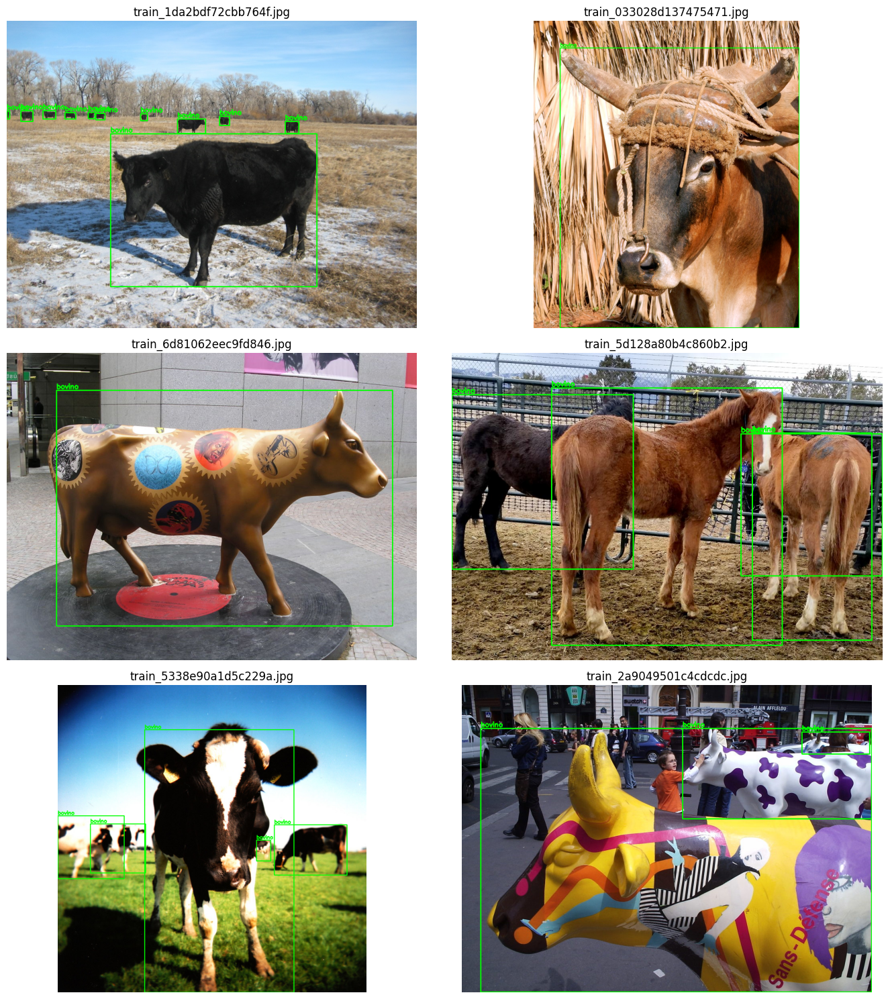

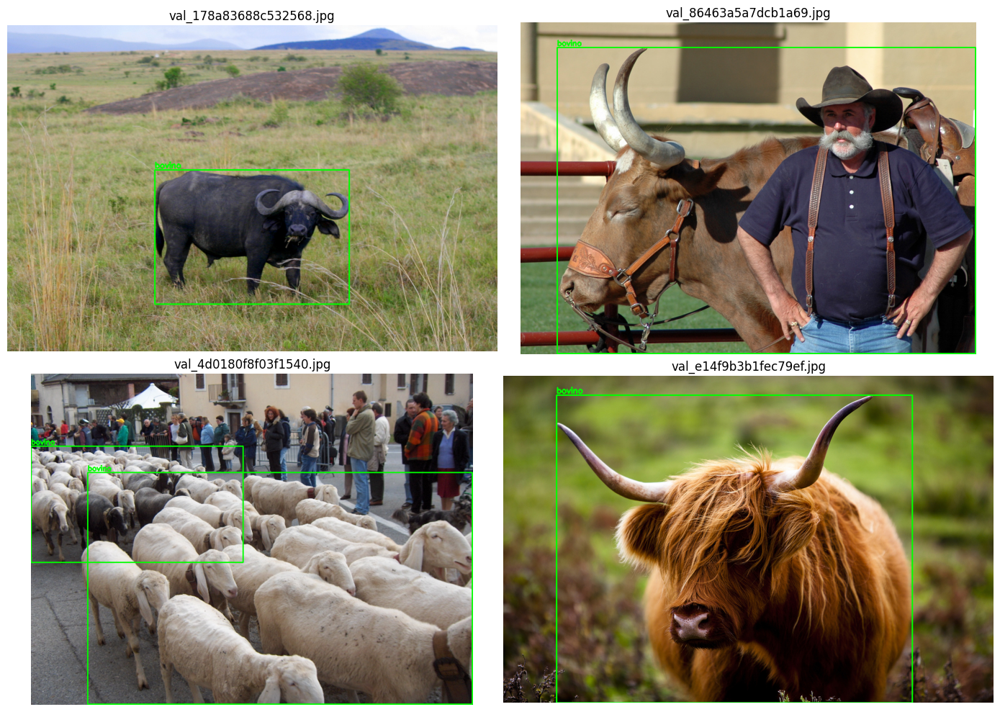

In [ ]:
TRAIN_SAMPLES = 1200
VAL_SAMPLES = 300
SEED = 42
OPEN_IMAGES_CLASS = "Cattle"

DATASET_DIR = ROOT_WORK / "vigiagado_openimages_cattle"
DATA_YAML = DATASET_DIR / "data.yaml"
DATASET_REPORT_PATH = DATASET_DIR / "dataset_report.json"
DATASET_MANIFEST_PATH = DATASET_DIR / "manifest.csv"

def _detect_field(dataset):
    fields = set(dataset.get_field_schema().keys())
    for candidate in ("ground_truth", "detections"):
        if candidate in fields:
            return candidate
    raise RuntimeError(f"Campo de detecção não identificado. Campos: {sorted(fields)}")

def _export_cattle_view(view, label_field, split_name, output_root):
    # Exportação manual garante classe única 0 e estrutura auditável.
    image_dir = output_root / "images" / split_name
    label_dir = output_root / "labels" / split_name
    image_dir.mkdir(parents=True, exist_ok=True)
    label_dir.mkdir(parents=True, exist_ok=True)

    rows = []
    box_total = 0
    for sample in view:
        src = Path(sample.filepath)
        if not src.is_file():
            raise FileNotFoundError(f"Imagem do FiftyOne não encontrada: {src}")

        container = sample[label_field]
        detections = [] if container is None else list(getattr(container, "detections", []))
        detections = [d for d in detections if str(d.label).lower() == "cattle"]
        if not detections:
            continue

        stem = f"{split_name}_{src.stem}"
        dst_img = image_dir / f"{stem}{src.suffix.lower()}"
        dst_lbl = label_dir / f"{stem}.txt"

        label_lines = []
        for det in detections:
            x, y, w, h = map(float, det.bounding_box)
            values = [x, y, w, h]
            if (not all(np.isfinite(values)) or
                not (0 <= x <= 1 and 0 <= y <= 1 and 0 < w <= 1 and 0 < h <= 1) or
                x + w > 1 + 1e-6 or y + h > 1 + 1e-6):
                raise ValueError(f"Bounding box inválida em {src.name}: {values}")
            cx, cy = x + w / 2, y + h / 2
            label_lines.append(f"0 {cx:.8f} {cy:.8f} {w:.8f} {h:.8f}")

        shutil.copy2(src, dst_img)
        dst_lbl.write_text("\n".join(label_lines) + "\n", encoding="utf-8")
        box_total += len(label_lines)
        rows.append({
            "split": split_name,
            "source_file": src.name,
            "export_file": dst_img.name,
            "boxes": len(label_lines),
        })

    return rows, box_total

def _audit_yolo_split(root, split_name):
    image_dir = root / "images" / split_name
    label_dir = root / "labels" / split_name
    image_exts = {".jpg", ".jpeg", ".png", ".bmp", ".webp"}
    images = {p.stem: p for p in image_dir.iterdir() if p.suffix.lower() in image_exts}
    labels = {p.stem: p for p in label_dir.glob("*.txt")}
    errors = []
    boxes = 0
    images_without_boxes = 0

    for stem, image_path in images.items():
        frame = cv2.imread(str(image_path))
        if frame is None or frame.size == 0:
            errors.append(f"imagem corrompida: {image_path.name}")
        label_path = labels.get(stem)
        if label_path is None:
            errors.append(f"imagem sem label: {image_path.name}")
            images_without_boxes += 1
            continue
        valid_rows = 0
        for line_no, line in enumerate(label_path.read_text(encoding="utf-8").splitlines(), 1):
            if not line.strip():
                continue
            parts = line.split()
            if len(parts) != 5:
                errors.append(f"{label_path.name}:{line_no} deve ter 5 campos")
                continue
            try:
                cls = int(parts[0])
                coords = list(map(float, parts[1:]))
            except Exception:
                errors.append(f"{label_path.name}:{line_no} contém valores inválidos")
                continue
            if cls != 0:
                errors.append(f"{label_path.name}:{line_no} class_id={cls}, esperado 0")
            cx, cy, w, h = coords
            if not all(np.isfinite(coords)) or not all(0 <= v <= 1 for v in coords):
                errors.append(f"{label_path.name}:{line_no} coordenada fora de [0,1]")
            if w <= 0 or h <= 0:
                errors.append(f"{label_path.name}:{line_no} largura/altura não positiva")
            valid_rows += 1
        if valid_rows == 0:
            images_without_boxes += 1
        boxes += valid_rows

    labels_without_images = sorted(set(labels) - set(images))
    errors += [f"label sem imagem: {labels[s].name}" for s in labels_without_images]
    return {
        "images": len(images),
        "labels": len(labels),
        "boxes": boxes,
        "images_without_boxes": images_without_boxes,
        "labels_without_images": len(labels_without_images),
        "errors": errors,
    }

def _preview_yolo(root, split_name, n=6, seed=42):
    import random
    import matplotlib.pyplot as plt

    image_dir = root / "images" / split_name
    label_dir = root / "labels" / split_name
    images = sorted([
        p for p in image_dir.iterdir()
        if p.suffix.lower() in {".jpg", ".jpeg", ".png", ".bmp", ".webp"}
    ])
    if not images:
        raise RuntimeError(f"Nenhuma imagem para prévia em {split_name}.")

    chosen = random.Random(seed).sample(images, min(n, len(images)))
    cols = 2
    rows = int(np.ceil(len(chosen) / cols))
    fig, axes = plt.subplots(rows, cols, figsize=(14, 5 * rows))
    axes = np.array(axes).reshape(-1)

    for ax, image_path in zip(axes, chosen):
        img = cv2.imread(str(image_path))
        h, w = img.shape[:2]
        label_path = label_dir / f"{image_path.stem}.txt"
        for line in label_path.read_text(encoding="utf-8").splitlines():
            cls, cx, cy, bw, bh = line.split()
            cx, cy, bw, bh = map(float, (cx, cy, bw, bh))
            x1, y1 = int((cx - bw/2) * w), int((cy - bh/2) * h)
            x2, y2 = int((cx + bw/2) * w), int((cy + bh/2) * h)
            cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 0), 2)
            cv2.putText(img, "bovino", (x1, max(18, y1-4)),
                        cv2.FONT_HERSHEY_SIMPLEX, .55, (0, 255, 0), 2)
        ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        ax.set_title(image_path.name)
        ax.axis("off")

    for ax in axes[len(chosen):]:
        ax.axis("off")
    plt.tight_layout()
    plt.show()

def _dataset_ready():
    if not DATA_YAML.is_file() or not DATASET_REPORT_PATH.is_file():
        return False
    try:
        report = json.loads(DATASET_REPORT_PATH.read_text(encoding="utf-8"))
    except Exception:
        return False
    required_dirs = [
        DATASET_DIR / "images" / "train",
        DATASET_DIR / "images" / "val",
        DATASET_DIR / "labels" / "train",
        DATASET_DIR / "labels" / "val",
    ]
    return report.get("status") == "aprovado" and all(p.is_dir() for p in required_dirs)

DATASET_REPORT = (
    json.loads(DATASET_REPORT_PATH.read_text(encoding="utf-8"))
    if DATASET_REPORT_PATH.is_file() else {"status": "não executado"}
)

if RETRAIN_MODEL:
    if _dataset_ready():
        print("Dataset preparado e auditoria aprovada encontrados; reutilizando:", DATASET_DIR)
        audit_train = _audit_yolo_split(DATASET_DIR, "train")
        audit_val = _audit_yolo_split(DATASET_DIR, "val")
        all_errors = audit_train["errors"] + audit_val["errors"]
        if all_errors:
            raise RuntimeError(
                "O dataset existente tinha relatório aprovado, mas a auditoria atual encontrou "
                f"{len(all_errors)} problema(s). Não será reutilizado silenciosamente."
            )
        _preview_yolo(DATASET_DIR, "train", n=6, seed=SEED)
        _preview_yolo(DATASET_DIR, "val", n=4, seed=SEED + 1)
    else:
        if DATASET_DIR.exists():
            backup = DATASET_DIR.with_name(
                DATASET_DIR.name + "_preservado_" + datetime.now().strftime("%Y%m%d_%H%M%S")
            )
            shutil.move(str(DATASET_DIR), str(backup))
            print("Dataset anterior incompleto/não aprovado preservado em:", backup)

        import fiftyone as fo
        import fiftyone.zoo as foz
        from fiftyone import ViewField as F

        stamp = datetime.now().strftime("%Y%m%d_%H%M%S")
        train_ds = foz.load_zoo_dataset(
            "open-images-v7",
            split="train",
            label_types=["detections"],
            classes=[OPEN_IMAGES_CLASS],
            max_samples=TRAIN_SAMPLES,
            shuffle=True,
            seed=SEED,
            only_matching=True,
            dataset_name=f"vigiagado_oi_train_{SEED}_{TRAIN_SAMPLES}_{stamp}",
        )
        val_ds = foz.load_zoo_dataset(
            "open-images-v7",
            split="validation",
            label_types=["detections"],
            classes=[OPEN_IMAGES_CLASS],
            max_samples=VAL_SAMPLES,
            shuffle=True,
            seed=SEED,
            only_matching=True,
            dataset_name=f"vigiagado_oi_val_{SEED}_{VAL_SAMPLES}_{stamp}",
        )

        train_field, val_field = _detect_field(train_ds), _detect_field(val_ds)
        train_view = train_ds.filter_labels(
            train_field, F("label") == OPEN_IMAGES_CLASS, only_matches=True
        )
        val_view = val_ds.filter_labels(
            val_field, F("label") == OPEN_IMAGES_CLASS, only_matches=True
        )

        train_rows, train_boxes = _export_cattle_view(
            train_view, train_field, "train", DATASET_DIR
        )
        val_rows, val_boxes = _export_cattle_view(
            val_view, val_field, "val", DATASET_DIR
        )

        DATA_YAML.write_text(
            f"path: {DATASET_DIR.resolve()}\n"
            "train: images/train\n"
            "val: images/val\n"
            "names:\n"
            "  0: bovino\n",
            encoding="utf-8",
        )

        pd.DataFrame(train_rows + val_rows).to_csv(
            DATASET_MANIFEST_PATH, index=False, encoding="utf-8"
        )

        audit_train = _audit_yolo_split(DATASET_DIR, "train")
        audit_val = _audit_yolo_split(DATASET_DIR, "val")
        all_errors = audit_train["errors"] + audit_val["errors"]

        DATASET_REPORT = {
            "status": "aprovado" if not all_errors else "falhou",
            "dataset": "Open Images V7",
            "source": "Google Open Images via FiftyOne Dataset Zoo",
            "annotations_license": "CC BY 4.0",
            "images_license_listing": "CC BY 2.0",
            "license_note": (
                "O Open Images recomenda verificar a licença de cada imagem. "
                "O dataset completo não é redistribuído por este projeto."
            ),
            "class_source": "Cattle",
            "class_exported": {"0": "bovino"},
            "seed": SEED,
            "requested": {"train": TRAIN_SAMPLES, "validation": VAL_SAMPLES},
            "effective": {
                "train_images": len(train_rows),
                "validation_images": len(val_rows),
                "train_boxes": train_boxes,
                "validation_boxes": val_boxes,
            },
            "audit": {"train": audit_train, "val": audit_val},
        }
        DATASET_REPORT_PATH.write_text(
            json.dumps(DATASET_REPORT, ensure_ascii=False, indent=2),
            encoding="utf-8",
        )
        print(json.dumps(DATASET_REPORT, ensure_ascii=False, indent=2))

        if all_errors:
            raise RuntimeError(
                f"Auditoria falhou com {len(all_errors)} problema(s). "
                "O treinamento foi bloqueado."
            )

        _preview_yolo(DATASET_DIR, "train", n=6, seed=SEED)
        _preview_yolo(DATASET_DIR, "val", n=4, seed=SEED + 1)
else:
    print("RETRAIN_MODEL=False: Open Images não será baixado nem preparado.")


## 9. Preparação e auditoria
Quando o retreinamento está ativado, a preparação verifica:

- correspondência imagem/label;
- arquivos de imagem legíveis;
- cinco campos por linha YOLO;
- `class_id = 0`;
- coordenadas normalizadas em `[0,1]`;
- largura e altura positivas;
- imagens sem boxes;
- labels sem imagens.

Também são exibidas amostras aleatórias de treino e validação com as bounding boxes convertidas. Qualquer erro programático bloqueia o treinamento.

Se um dataset preparado e aprovado já existir, ele é **reutilizado e auditado novamente**. Um diretório existente que esteja incompleto ou reprovado é preservado com timestamp antes de uma nova preparação.


## 10. Fine-tuning YOLO26s
O modelo inicial é exclusivamente **`yolo26s.pt` com pesos pré-treinados**. Não há treinamento do zero.

Configuração:

- `imgsz=640`;
- `epochs=40`;
- `patience=10`;
- `batch=-1`;
- `seed=42`;
- AMP quando CUDA estiver disponível;
- GPU `device=0` quando disponível.

Durante o treino, `best.pt`, `last.pt`, o checkpoint ao fim da época 9 quando disponível e demais artefatos são copiados para `/content/vigiagado_artifacts/`. Um `best.pt` anterior é arquivado antes de um novo treinamento, evitando sobrescrita silenciosa.


In [ ]:
TRAIN_RUNS_DIR = ROOT_WORK / "vigiagado_training_runs"
TRAIN_RUNS_DIR.mkdir(parents=True, exist_ok=True)

TRAIN_PARAMS = {
    "model": "yolo26s.pt",
    "imgsz": 640,
    "epochs": 40,
    "patience": 10,
    "batch": -1,
    "seed": SEED,
    "amp": bool(torch.cuda.is_available()),
    "device": 0 if torch.cuda.is_available() else "cpu",
}

def _copy_if_exists(src, dst):
    if src is None:
        return False
    src = Path(src)
    if src.is_file():
        shutil.copy2(src, dst)
        return True
    return False

def preserve_checkpoint(trainer):
    # Preserva checkpoints fora de runs/ para reduzir risco de perda em interrupção.
    ARTIFACT_DIR.mkdir(parents=True, exist_ok=True)
    _copy_if_exists(getattr(trainer, "best", None), BEST_WEIGHTS)
    _copy_if_exists(getattr(trainer, "last", None), LAST_WEIGHTS)

    # trainer.epoch é zero-based; 8 corresponde ao término da 9ª época.
    if getattr(trainer, "epoch", -1) == 8:
        _copy_if_exists(getattr(trainer, "last", None), EPOCH9_WEIGHTS)

    save_dir = Path(getattr(trainer, "save_dir", ""))
    for name in ["results.csv", "args.yaml"]:
        _copy_if_exists(save_dir / name, ARTIFACT_DIR / name)

def collect_run_artifacts(run_dir):
    run_dir = Path(run_dir)
    wanted = [
        "results.csv", "args.yaml", "results.png",
        "confusion_matrix.png", "confusion_matrix_normalized.png",
        "PR_curve.png", "F1_curve.png", "P_curve.png", "R_curve.png",
        "labels.jpg", "labels_correlogram.jpg",
    ]
    for name in wanted:
        _copy_if_exists(run_dir / name, ARTIFACT_DIR / name)

    _copy_if_exists(run_dir / "weights" / "best.pt", BEST_WEIGHTS)
    _copy_if_exists(run_dir / "weights" / "last.pt", LAST_WEIGHTS)

    for src in [DATA_YAML, DATASET_REPORT_PATH, DATASET_MANIFEST_PATH]:
        if Path(src).is_file():
            shutil.copy2(src, ARTIFACT_DIR / Path(src).name)

TRAIN_RESULT = None
TRAIN_RUN_DIR = None

if RETRAIN_MODEL:
    if not DATA_YAML.is_file() or not DATASET_REPORT_PATH.is_file():
        raise FileNotFoundError("Dataset preparado/auditado não encontrado.")

    audit_report = json.loads(DATASET_REPORT_PATH.read_text(encoding="utf-8"))
    if audit_report.get("status") != "aprovado":
        raise RuntimeError("Dataset não está com auditoria aprovada; treinamento bloqueado.")

    if BEST_WEIGHTS.exists():
        archive = ARTIFACT_DIR / "archive"
        archive.mkdir(exist_ok=True)
        stamp = datetime.now().strftime("%Y%m%d_%H%M%S")
        shutil.copy2(BEST_WEIGHTS, archive / f"yolo26s_bovino_best_{stamp}.pt")
        print("Best anterior preservado antes do novo treinamento.")

    train_model = YOLO("yolo26s.pt")
    train_model.add_callback("on_model_save", preserve_checkpoint)

    run_name = "yolo26s_bovino_" + datetime.now().strftime("%Y%m%d_%H%M%S")
    TRAIN_RESULT = train_model.train(
        data=str(DATA_YAML),
        imgsz=TRAIN_PARAMS["imgsz"],
        epochs=TRAIN_PARAMS["epochs"],
        patience=TRAIN_PARAMS["patience"],
        batch=TRAIN_PARAMS["batch"],
        seed=TRAIN_PARAMS["seed"],
        device=TRAIN_PARAMS["device"],
        amp=TRAIN_PARAMS["amp"],
        project=str(TRAIN_RUNS_DIR),
        name=run_name,
        exist_ok=False,
        plots=True,
        cache=False,
        workers=2,
        verbose=True,
    )

    TRAIN_RUN_DIR = Path(train_model.trainer.save_dir)
    collect_run_artifacts(TRAIN_RUN_DIR)

    manifest = {
        "created_at": datetime.now().isoformat(),
        "params": TRAIN_PARAMS,
        "run_dir": str(TRAIN_RUN_DIR),
        "best_weights": str(BEST_WEIGHTS) if BEST_WEIGHTS.exists() else None,
        "last_weights": str(LAST_WEIGHTS) if LAST_WEIGHTS.exists() else None,
        "epoch9_weights": str(EPOCH9_WEIGHTS) if EPOCH9_WEIGHTS.exists() else None,
        "dataset_yaml": str(DATA_YAML),
        "hardware": {
            "device": gpu_name,
            "cuda_available": bool(torch.cuda.is_available()),
            "vram_gb": round(gpu_vram_gb, 2) if torch.cuda.is_available() else 0,
        },
    }
    TRAINING_MANIFEST.write_text(
        json.dumps(manifest, ensure_ascii=False, indent=2), encoding="utf-8"
    )
    print("Treinamento concluído. Artefatos:", ARTIFACT_DIR)
else:
    print("RETRAIN_MODEL=False: treinamento não será executado.")


New https://pypi.org/project/ultralytics/8.4.150 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.4.147 🚀 Python-3.13.15 torch-2.11.0+cu128 CUDA:0 (NVIDIA A100-SXM4-40GB, 40441MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=-1, bgr=0.0, box=7.5, cache=False, cfg=None, channels_last=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, cls_remap=True, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/vigiagado_openimages_cattle/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dgrad=0.5, dis=6.0, distill_model=None, dlam=1.0, dlog=1.0, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=40, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup

## 11. Avaliação formal
Quando `RETRAIN_MODEL=True`, o `best.pt` é validado no split `validation` preparado do Open Images e são salvos:

- Precision;
- Recall;
- mAP@50;
- mAP@50–95.

No modo de apresentação, a validação pesada não é refeita. Se `finetuned_metrics.json` estiver disponível, suas métricas são apenas carregadas e mostradas. Caso contrário, o notebook informa que elas não foram encontradas.


In [ ]:
FINETUNED_METRICS = None

if RETRAIN_MODEL:
    if not BEST_WEIGHTS.is_file():
        raise FileNotFoundError(f"best.pt especializado não encontrado em {BEST_WEIGHTS}.")
    if not DATA_YAML.is_file():
        raise FileNotFoundError(f"Dataset YAML não encontrado: {DATA_YAML}")

    eval_model = YOLO(str(BEST_WEIGHTS))
    metrics = eval_model.val(
        data=str(DATA_YAML),
        split="val",
        imgsz=640,
        device=0 if torch.cuda.is_available() else "cpu",
        plots=True,
        project=str(ROOT_WORK / "vigiagado_eval_runs"),
        name="yolo26s_bovino_validation_" + datetime.now().strftime("%Y%m%d_%H%M%S"),
    )

    report = (
        json.loads(DATASET_REPORT_PATH.read_text(encoding="utf-8"))
        if DATASET_REPORT_PATH.is_file() else {}
    )
    FINETUNED_METRICS = {
        "precision": float(metrics.box.mp),
        "recall": float(metrics.box.mr),
        "mAP50": float(metrics.box.map50),
        "mAP50_95": float(metrics.box.map),
        "validation_images": report.get("effective", {}).get("validation_images"),
        "weights": str(BEST_WEIGHTS),
        "data": str(DATA_YAML),
    }
    FINETUNED_METRICS_PATH.write_text(
        json.dumps(FINETUNED_METRICS, ensure_ascii=False, indent=2),
        encoding="utf-8",
    )

    eval_save_dir = Path(metrics.save_dir)
    for name in [
        "confusion_matrix.png", "confusion_matrix_normalized.png",
        "PR_curve.png", "F1_curve.png", "P_curve.png", "R_curve.png"
    ]:
        _copy_if_exists(eval_save_dir / name, ARTIFACT_DIR / name)

    display(pd.DataFrame([FINETUNED_METRICS]))
else:
    if FINETUNED_METRICS_PATH.is_file():
        FINETUNED_METRICS = json.loads(
            FINETUNED_METRICS_PATH.read_text(encoding="utf-8")
        )
        display(pd.DataFrame([FINETUNED_METRICS]))
    else:
        print("Métricas de validação não encontradas.")


Ultralytics 8.4.147 🚀 Python-3.13.15 torch-2.11.0+cu128 CUDA:0 (NVIDIA A100-SXM4-40GB, 40441MiB)
YOLO26s summary (fused): 120 layers, 9,465,567 parameters, 0 gradients, 20.8 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2767.8±660.9 MB/s, size: 217.3 KB)
val: Scanning /content/vigiagado_openimages_cattle/labels/val.cache... 134 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 134/134 43.2Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 4.6it/s 2.0s
                   all        134        259      0.682      0.552      0.599      0.428
Speed: 1.3ms preprocess, 4.0ms inference, 0.0ms loss, 4.6ms postprocess per image
Results saved to /content/vigiagado_eval_runs/yolo26s_bovino_validation_20260913_214629


,precision,recall,mAP50,mAP50_95,validation_images,weights,data
0,0.68238,0.552124,0.598855,0.427744,134,/content/vigiagado_artifacts/yolo26s_bovino_be...,/content/vigiagado_openimages_cattle/data.yaml


## 12. Carregamento do modelo especializado
A partir deste ponto o produto utiliza o peso canônico `yolo26s_bovino_best.pt`.

O carregamento verifica `model.names` e interrompe a execução se o arquivo não representar exatamente a classe única `0: bovino`. Isso reduz o risco de executar acidentalmente um peso incompatível.


In [ ]:
MODEL, COW_IDS = load_model(BEST_WEIGHTS)
print("Detector carregado:", BEST_WEIGHTS)
print("Classes:", MODEL.names)

CONFIDENCE = 0.25
IMAGE_SIZE = 960
PROCESS_FPS = 12


Detector carregado: /content/vigiagado_artifacts/yolo26s_bovino_best.pt
Classes: {0: 'bovino'}


## 13. Configuração espacial e temporal do produto
A ROI é definida em coordenadas relativas da imagem. O bottom-center de cada bounding box é usado como aproximação da posição do bovino no solo.

As heurísticas temporais permanecem as mesmas do MVP:

- confirmação de presença: ~0,25 s;
- confirmação de ausência nas detecções: ~0,75 s;
- persistência de divergência: 2,0 s;
- retorno da divergência: 1,0 s.

O `imgsz=960` abaixo é de **inferência no vídeo** e é independente do `imgsz=640` utilizado no fine-tuning.


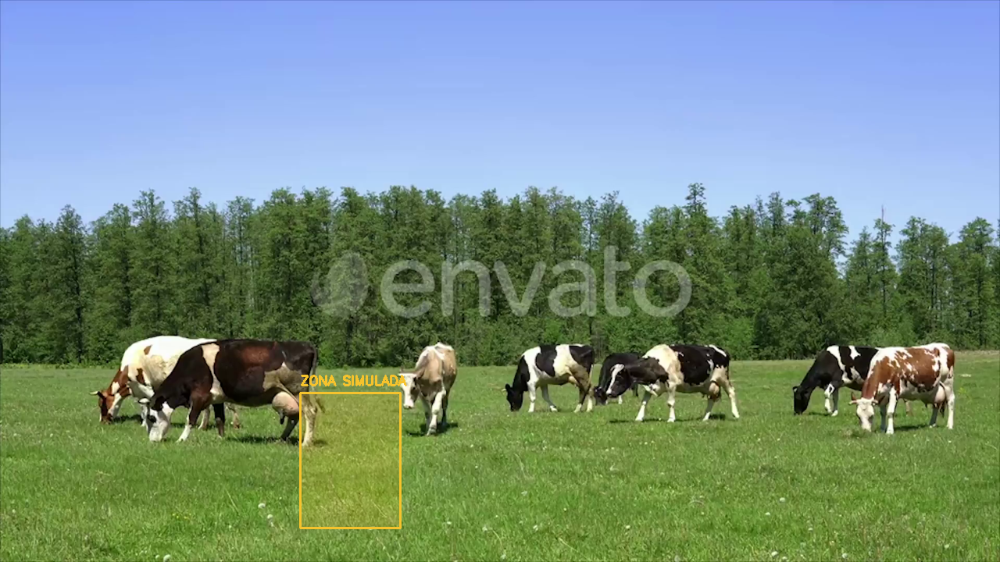

In [ ]:
ROI_LEFT = 0.30 #@param {type:"number"}
ROI_TOP = 0.70 #@param {type:"number"}
ROI_RIGHT = 0.40 #@param {type:"number"}
ROI_BOTTOM = 0.94 #@param {type:"number"}
ROI = (ROI_LEFT, ROI_TOP, ROI_RIGHT, ROI_BOTTOM)

EXPECTED_COUNT = 7 #@param {type:"integer"}
COMPARE_COUNT = True #@param {type:"boolean"}
TOLERANCE = 0 #@param {type:"integer"}
DIVERGENCE_SECONDS = 2.0 #@param {type:"number"}
EXPECTED = EXPECTED_COUNT if COMPARE_COUNT else None
validate_expected_count(EXPECTED, TOLERANCE)

cap = cv2.VideoCapture(str(DEMO_VIDEO))
ok, preview = cap.read()
cap.release()
if not ok:
    raise ValueError("Não foi possível criar a prévia da ROI.")

preview = cv2.resize(preview, (1280, 720))
rectangle_pixels(ROI, preview.shape)
preview, _ = draw_zone(preview, [], ROI)
display(Image.fromarray(cv2.cvtColor(preview, cv2.COLOR_BGR2RGB)))


## 14. Pipeline VigiaGado
O pipeline final continua único:

**gado5 → YOLO26s fine-tuned → detecções → contagem → Danger Zone → regras temporais → eventos → evidências → decisão humana**

A contagem é a quantidade de bovinos visíveis detectados no frame. `EXPECTED_COUNT` representa uma referência para a área visível, não o inventário completo da propriedade.

Mensagem de divergência: **“Possível divergência na contagem visual — recomenda-se verificação.”**


In [ ]:
RUN_DIR = (
    Path(os.environ.get("VIGIAGADO_OUTPUT_DIR", str(ROOT_WORK / "resultados")))
    / datetime.now().strftime("%Y%m%d_%H%M%S_%f")
)
RUN_DIR.mkdir(parents=True, exist_ok=False)

FINAL = process_video(
    DEMO_VIDEO,
    RUN_DIR / "gado5_final",
    roi=ROI,
    expected_count=EXPECTED,
    confidence=CONFIDENCE,
    imgsz=IMAGE_SIZE,
    fps=PROCESS_FPS,
    tolerance=TOLERANCE,
    divergence_s=DIVERGENCE_SECONDS,
    model=MODEL,
    cow_ids=COW_IDS,
)

print("Processamento concluído:", FINAL["output"])


MVP: 0/326 frames | 0.0s | bovinos=7 | zona=0
MVP: 60/326 frames | 5.0s | bovinos=10 | zona=0
MVP: 120/326 frames | 10.0s | bovinos=8 | zona=1
MVP: 180/326 frames | 15.0s | bovinos=9 | zona=1
MVP: 240/326 frames | 20.0s | bovinos=8 | zona=1
MVP: 300/326 frames | 25.0s | bovinos=9 | zona=1
Processamento concluído: /content/resultados/20260913_214634_932571/gado5_final/VigiaGado_demo.mp4


## 15. Demonstração e resultados
Os resultados abaixo são observações do detector no vídeo de demonstração; `gado5` não possui ground truth certificado para contagem.

A tabela de episódios não representa animais únicos. As evidências registram os instantes de confirmação das regras temporais.


In [ ]:
display(Video(FINAL["output"], embed=True, width=1000))

FINAL_DIR = Path(FINAL["output"]).parent
FINAL_COUNTS = pd.read_csv(FINAL_DIR / "contagens.csv")
FINAL_EVENTS = pd.read_csv(FINAL_DIR / "eventos.csv")
FINAL_EPISODES = pd.read_csv(FINAL_DIR / "episodios.csv")

display(pd.DataFrame([{
    k: v for k, v in FINAL.items()
    if k not in {"output", "roi", "note"}
}]))
display(FINAL_EVENTS)
display(FINAL_EPISODES)

print(
    "Contagem visual — min:", int(FINAL_COUNTS["count"].min()),
    "| max:", int(FINAL_COUNTS["count"].max()),
    "| média:", round(float(FINAL_COUNTS["count"].mean()), 3),
    "| desvio:", round(float(FINAL_COUNTS["count"].std(ddof=0)), 3),
)


,video,frames,fps,duration_s,count_min,count_max,zone_episodes,event_records,expected_count,confidence,imgsz,tolerance,zone_enter_s,zone_clear_s,divergence_s,device,elapsed_s,divergence_active_at_end,zone_active_at_end
0,gado5.mp4,326,12,27.166667,7,12,2,4,7,0.25,960,0,0.25,0.75,2.0,cuda,21.103,True,True


,event,type,video_time_s,confirmed_at_s,frame,count,zone_count,expected_count,evidence
0,1,divergencia_iniciada,3.6667,5.6667,68,10,0,7,evidencias/evento_001_divergencia_iniciada.jpg
1,2,presenca_iniciada,9.9167,10.1667,122,8,1,7,evidencias/evento_002_presenca_iniciada.jpg
2,3,presenca_deixou_de_ser_detectada,11.0000,11.7500,141,8,0,7,evidencias/evento_003_presenca_deixou_de_ser_d...
3,4,presenca_iniciada,14.1667,14.4167,173,10,1,7,evidencias/evento_004_presenca_iniciada.jpg


,episode,start_s,confirmed_start_s,end_s,confirmed_end_s,peak_zone_count,status
0,1,9.9167,10.166667,11.0,11.75,1,presenca_deixou_de_ser_detectada
1,2,14.1667,14.416667,NaN,NaN,1,aberto_ao_fim_do_video


Contagem visual — min: 7 | max: 12 | média: 8.445 | desvio: 0.934


## 16. Artefatos e downloads
A execução cria dois pacotes quando aplicável:

- **resultados do produto:** vídeo anotado, CSVs, JSON e evidências;
- **artefatos do detector:** pesos, métricas, curvas, `data.yaml`, relatório e manifesto do dataset.

Nenhum placeholder de peso ou métrica é criado.


In [ ]:
for src in [
    DATA_YAML, DATASET_REPORT_PATH, DATASET_MANIFEST_PATH,
    FINETUNED_METRICS_PATH, TRAINING_MANIFEST
]:
    if Path(src).is_file():
        dst = ARTIFACT_DIR / Path(src).name
        if Path(src).resolve() != dst.resolve():
            shutil.copy2(src, dst)

RESULT_ZIP = shutil.make_archive(
    str(ROOT_WORK / ("VigiaGado_resultados_" + datetime.now().strftime("%Y%m%d_%H%M%S"))),
    "zip",
    FINAL_DIR,
)
print("Resultados:", RESULT_ZIP)
display(FileLink(RESULT_ZIP))

available_artifacts = sorted(p for p in ARTIFACT_DIR.rglob("*") if p.is_file())
ARTIFACT_ZIP = None
if available_artifacts:
    ARTIFACT_ZIP = shutil.make_archive(
        str(ROOT_WORK / "vigiagado_artifacts"),
        "zip",
        ARTIFACT_DIR,
    )
    print("Artefatos:", ARTIFACT_ZIP)
    display(FileLink(ARTIFACT_ZIP))
else:
    print("Nenhum pacote adicional de artefatos disponível.")


Resultados: /content/VigiaGado_resultados_20260913_214656.zip


/content/VigiaGado_resultados_20260913_214656.zip

Artefatos: /content/vigiagado_artifacts.zip


/content/vigiagado_artifacts.zip

## 17. Verificações de contrato
Estas verificações exercitam geometria, bottom-center, persistência temporal e comparação de contagem. Elas não substituem a avaliação formal do detector.


In [ ]:
r = rectangle_pixels((.3,.7,.4,.94), (720,1280,3))
assert is_inside_zone([400,300,500,600], r)
assert not is_inside_zone([10,20,30,40], r)
assert is_inside_zone([r[0]-10,400,r[0]+10,r[1]], r)

s = TemporalState(.25,.75)
changes = []
for t, present in [
    (0,False),(.25,True),(.5,True),(.75,True),
    (1,False),(1.25,True),(1.5,False),(2,False),(2.25,False)
]:
    change = s.update(present, t)
    if change:
        changes.append(change)

assert [c["active"] for c in changes] == [True, False]
assert not count_differs(0,0)
assert count_differs(1,0)
assert not count_differs(3,None)
assert not count_differs(6,7,1)

d = TemporalState(2,1)
assert d.update(True,0) is None
assert d.update(True,1) is None
assert d.update(True,2)["active"]
assert d.update(False,3) is None
assert not d.update(False,4)["active"]

print("Geometria, estados temporais e comparação de contagem: verificações aprovadas.")


Geometria, estados temporais e comparação de contagem: verificações aprovadas.


## 18. Limitações
- O campo de visão da câmera limita o que pode ser observado.
- Oclusão, sobreposição, distância, vegetação e iluminação podem causar falsos positivos ou negativos.
- Contagem visual não equivale a inventário completo.
- Bottom-center e ROI são aproximações 2D.
- Danger Zone não é geofence física/GPS.
- Ausência de detecção não comprova ausência física.
- Não há tracking nem reconhecimento individual.
- O MVP utiliza vídeo gravado, não uma câmera em operação contínua.
- O vídeo `gado5` não possui ground truth certificado para contagem.
- O subconjunto acadêmico do Open Images não representa todas as condições de uma propriedade rural.
- O vídeo de demonstração não é redistribuído enquanto sua licença não estiver confirmada.


## 19. Conclusão
O VigiaGado final mantém a filosofia:

**modelo → observação → regra espacial/temporal → evento → evidência → decisão humana**

O fine-tuning com **Open Images V7 / `Cattle`** especializa o componente de percepção, enquanto o restante do produto mantém as regras espaciais e temporais já validadas no MVP.

Este notebook não inventa resultados de treinamento. Se um `best.pt` e métricas reais ainda não tiverem sido produzidos, eles permanecem explicitamente pendentes até a execução do modo `RETRAIN_MODEL=True` em um ambiente com GPU.
